# Introduction

In this notebook, we train a classifier to detect whether or not there are buildings in an image. This is used to filter out clearly mislabeled images in the MapAI dataset: by looking at the misclassified images with the greatest loss, we can surface some of the clear labeling mistakes. 

# Setup

In [1]:
from fastai.vision.all import *
from fastai.vision.widgets import *

In [2]:
#torch.cuda.set_device(1)

# Load data

In [3]:
import sys
sys.path.append("../src")

In [4]:
from constants import DATADIR
from utils import update_paths

In [5]:
#dataset = '../csv/train_val_original.csv' # Original data set produced in nb 00a
dataset = '../csv/train_val_noise.csv' # Partly cleaned-up data

In [6]:
df = pd.read_csv(dataset)
df.shape

(8112, 7)

In [7]:
df.head()

,image,lidar,mask,is_val,mask_percentage,is_building,wrong_annotation
0,../../data/train/images/6179_495_44.tif,../../data/train/lidar/6179_495_44.tif,../../data/train/masks/6179_495_44.tif,False,0.155224,True,False
1,../../data/train/images/6051_690_84.tif,../../data/train/lidar/6051_690_84.tif,../../data/train/masks/6051_690_84.tif,False,0.000000,False,False
2,../../data/train/images/6121_865_53.tif,../../data/train/lidar/6121_865_53.tif,../../data/train/masks/6121_865_53.tif,False,0.017824,True,False
3,../../data/train/images/6173_630_27.tif,../../data/train/lidar/6173_630_27.tif,../../data/train/masks/6173_630_27.tif,False,0.000000,False,False
4,../../data/train/images/6147_481_4.tif,../../data/train/lidar/6147_481_4.tif,../../data/train/masks/6147_481_4.tif,False,0.182664,True,False


In [8]:
df['image'] = df['image'].apply(update_paths)
df['lidar'] = df['lidar'].apply(update_paths)
df['mask'] = df['mask'].apply(update_paths)

In [9]:
df.head()

,image,lidar,mask,is_val,mask_percentage,is_building,wrong_annotation
0,/home/alex/data/mapai/data/train/images/6179_495_44.tif,/home/alex/data/mapai/data/train/lidar/6179_495_44.tif,/home/alex/data/mapai/data/train/masks/6179_495_44.tif,False,0.155224,True,False
1,/home/alex/data/mapai/data/train/images/6051_690_84.tif,/home/alex/data/mapai/data/train/lidar/6051_690_84.tif,/home/alex/data/mapai/data/train/masks/6051_690_84.tif,False,0.000000,False,False
2,/home/alex/data/mapai/data/train/images/6121_865_53.tif,/home/alex/data/mapai/data/train/lidar/6121_865_53.tif,/home/alex/data/mapai/data/train/masks/6121_865_53.tif,False,0.017824,True,False
3,/home/alex/data/mapai/data/train/images/6173_630_27.tif,/home/alex/data/mapai/data/train/lidar/6173_630_27.tif,/home/alex/data/mapai/data/train/masks/6173_630_27.tif,False,0.000000,False,False
4,/home/alex/data/mapai/data/train/images/6147_481_4.tif,/home/alex/data/mapai/data/train/lidar/6147_481_4.tif,/home/alex/data/mapai/data/train/masks/6147_481_4.tif,False,0.182664,True,False


# Train model

If we train a model on a dataset it can become difficult to use that model to filter the same data, as it may have overtrained for that purpose. We therefore train our model on a small sample of data and then use it to discover mislabeled data in the remaining data.

We randomly select 500 images for training:

In [10]:
is_training = df.loc[~df.is_val].sample(500, random_state=42).index
is_training

Int64Index([3089, 5825, 1452, 5927, 6071, 4755, 3332, 4728, 3098, 2526,
            ...
            6635,  706, 5944, 1446, 5422,  544, 2022, 2399, 5432, 2603],
           dtype='int64', length=500)

In [11]:
df['is_test'] = True

In [12]:
df.loc[is_training, 'is_test'] = False

In [13]:
df.head()

,image,lidar,mask,is_val,mask_percentage,is_building,wrong_annotation,is_test
0,/home/alex/data/mapai/data/train/images/6179_495_44.tif,/home/alex/data/mapai/data/train/lidar/6179_495_44.tif,/home/alex/data/mapai/data/train/masks/6179_495_44.tif,False,0.155224,True,False,True
1,/home/alex/data/mapai/data/train/images/6051_690_84.tif,/home/alex/data/mapai/data/train/lidar/6051_690_84.tif,/home/alex/data/mapai/data/train/masks/6051_690_84.tif,False,0.000000,False,False,True
2,/home/alex/data/mapai/data/train/images/6121_865_53.tif,/home/alex/data/mapai/data/train/lidar/6121_865_53.tif,/home/alex/data/mapai/data/train/masks/6121_865_53.tif,False,0.017824,True,False,True
3,/home/alex/data/mapai/data/train/images/6173_630_27.tif,/home/alex/data/mapai/data/train/lidar/6173_630_27.tif,/home/alex/data/mapai/data/train/masks/6173_630_27.tif,False,0.000000,False,False,True
4,/home/alex/data/mapai/data/train/images/6147_481_4.tif,/home/alex/data/mapai/data/train/lidar/6147_481_4.tif,/home/alex/data/mapai/data/train/masks/6147_481_4.tif,False,0.182664,True,False,True


In [14]:
df.is_test.value_counts()

True     7612
False     500
Name: is_test, dtype: int64

It is useful to run this process multiple times: train a model on some data; find and mark mislabeled images using the model; train the model on a sample from the cleaned-up data; repeat. 

If we've already run this process for one iteration and marked the wrongly labeled data in the column `mislabeled`, we will want to pick out only those still marked as correct. If this is the first run, we disregard the below computations:

In [15]:
try: 
    df = df.loc[~df.wrong_annotation].reset_index(drop=True)
except:
    print("Not filtered yet")
    pass

In [15]:
df.shape

(8112, 8)

In [16]:
df.is_test.value_counts()

True     7612
False     500
Name: is_test, dtype: int64

Check that there's a reasonable balance of images with and without buildings in the training set:

In [17]:
df.loc[df.is_test==False].is_building.value_counts()

True     384
False    116
Name: is_building, dtype: int64

# Set up data augmentation

In [18]:
batch_tfms=[Contrast(), Dihedral(), Brightness(), Rotate(max_deg=45), Saturation(),
            Zoom(), Normalize.from_stats(*imagenet_stats)] #RandomErasing()

# Create dataloaders

In [20]:
bs=64

In [21]:
dblock = DataBlock(blocks=(ImageBlock, CategoryBlock()),
                   splitter=ColSplitter('is_test'),
                   get_x=ColReader('image'),
                   get_y=ColReader('is_building'),
                   item_tfms=None,
                   batch_tfms=batch_tfms)

In [22]:
dls = dblock.dataloaders(df, bs=bs)

In [23]:
dls.train_ds

(#499) [(PILImage mode=RGB size=500x500, TensorCategory(0)),(PILImage mode=RGB size=500x500, TensorCategory(1)),(PILImage mode=RGB size=500x500, TensorCategory(1)),(PILImage mode=RGB size=500x500, TensorCategory(1)),(PILImage mode=RGB size=500x500, TensorCategory(1)),(PILImage mode=RGB size=500x500, TensorCategory(1)),(PILImage mode=RGB size=500x500, TensorCategory(1)),(PILImage mode=RGB size=500x500, TensorCategory(1)),(PILImage mode=RGB size=500x500, TensorCategory(1)),(PILImage mode=RGB size=500x500, TensorCategory(1))...]

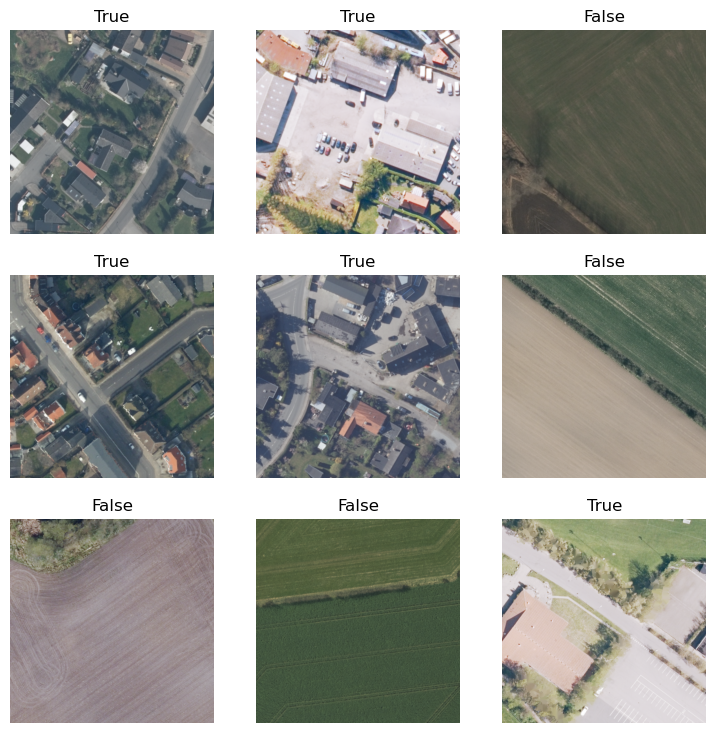

In [24]:
dls.show_batch(max_n=9)

# Define the model

In [25]:
learn = vision_learner(dls, resnet34, metrics=accuracy)

/home/ubuntu/anaconda3/envs/mapai/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/ubuntu/anaconda3/envs/mapai/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


# Train the model

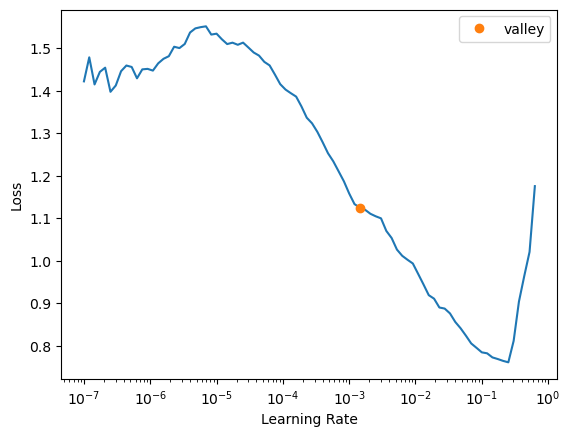

In [26]:
lr = learn.lr_find()

In [27]:
print(lr)

SuggestedLRs(valley=0.0014454397605732083)


In [28]:
learn.fine_tune(10, lr.valley)

epoch,train_loss,valid_loss,accuracy,time
0,1.053520,0.245000,0.918727,00:22


epoch,train_loss,valid_loss,accuracy,time
0,0.533909,0.112169,0.959890,00:23
1,0.473800,0.187058,0.936086,00:23
2,0.410970,0.187321,0.947265,00:22
3,0.382795,0.201354,0.950815,00:23
4,0.330419,0.190820,0.958443,00:23
5,0.275132,0.178027,0.961599,00:23
6,0.240431,0.170540,0.964098,00:23
7,0.211864,0.154740,0.967386,00:22
8,0.182545,0.150115,0.969095,00:23
9,0.161786,0.148028,0.968832,00:22


In [29]:
from datetime import date
today = date.today()

In [30]:
learn.save(f'is_building_model_{today}');

# Check for mislabeled images

In [31]:
def get_imgs(img_list, mask_list): 
    pil_img_list = []
    pil_mask_list = []
    
    for im, mask in list(zip(img_list, mask_list)):        
        im = Image.open(im)
        pil_img_list.append(im)
        
        mask = Image.open(mask)
        pil_mask_list.append(mask)
        
    return pil_img_list, pil_mask_list

In [32]:
learn.load(f'is_building_model_{today}');

## In the training data

In [33]:
interp = ClassificationInterpretation.from_learner(learn, dl=dls.train)
interp_df = dls.train.items.reset_index(drop=True)

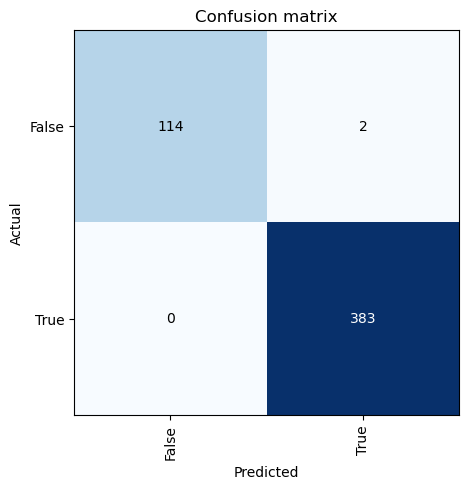

In [34]:
interp.plot_confusion_matrix()

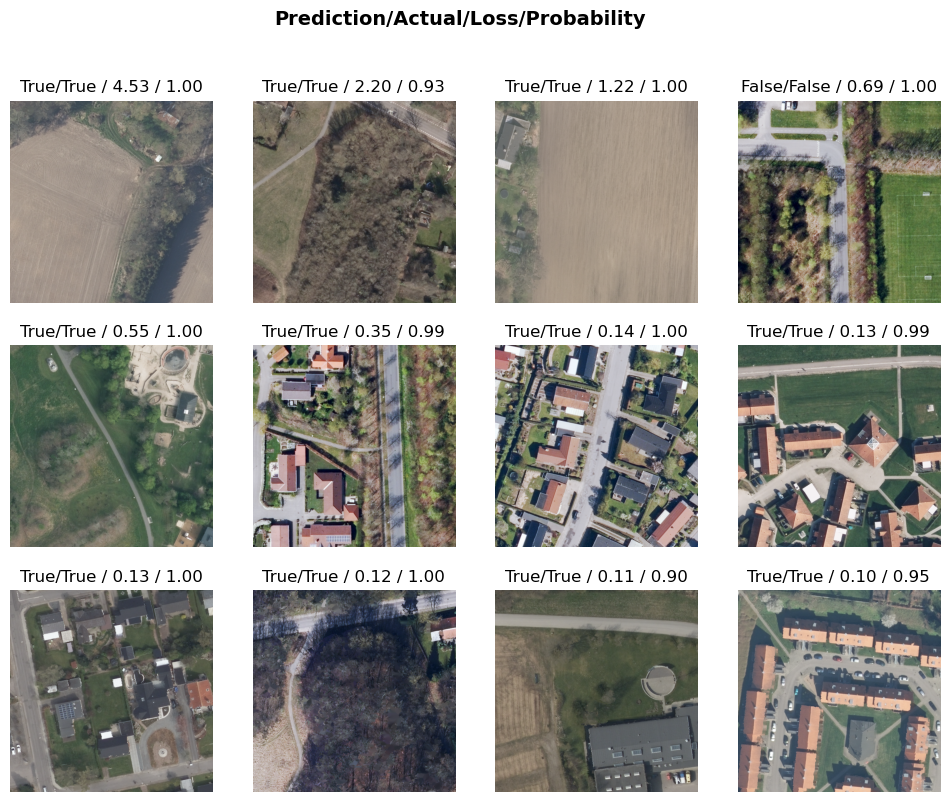

In [35]:
interp.plot_top_losses(k=12,largest=True) 

## In the rest of the data

In [36]:
interp = ClassificationInterpretation.from_learner(learn)
interp_df = dls.valid.items.reset_index(drop=True)

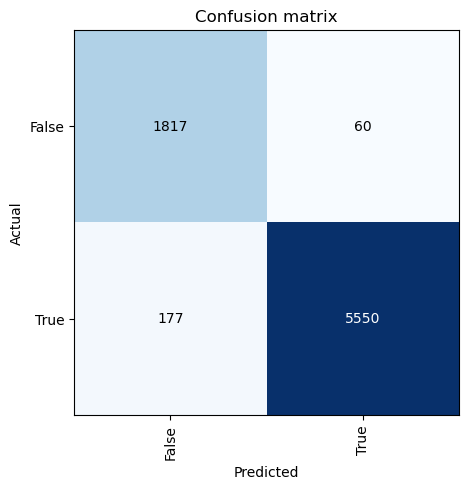

In [37]:
interp.plot_confusion_matrix()

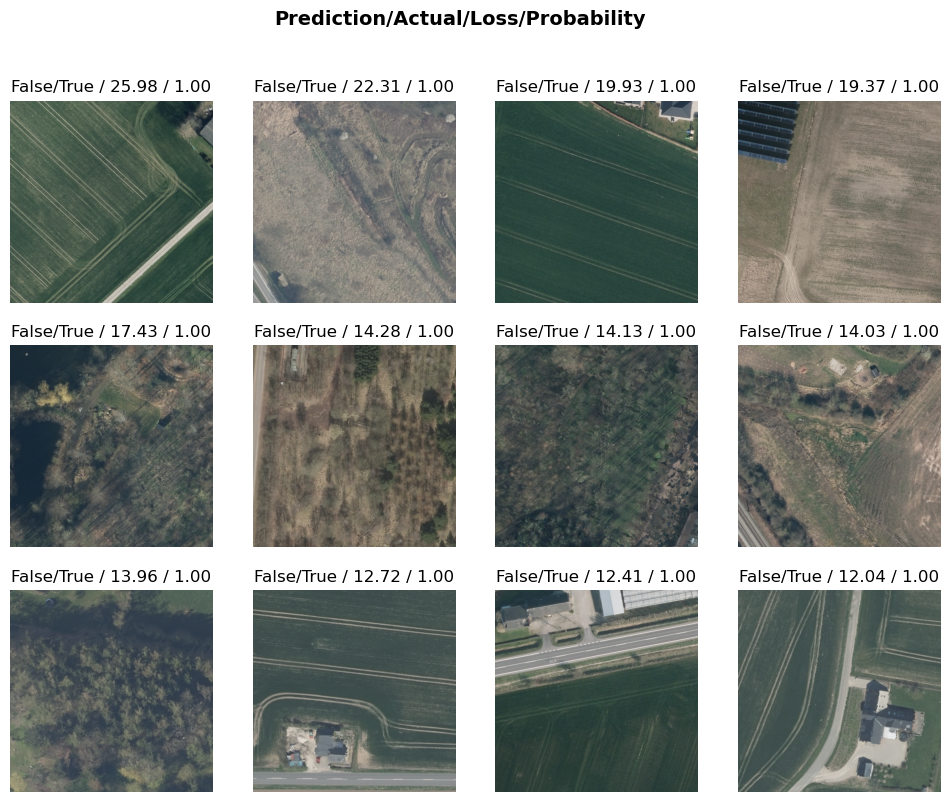

In [38]:
interp.plot_top_losses(k=12,largest=True) 

In [39]:
losses, indexes = interp.top_losses(k=50, largest=True)

# Manually inspect and delete mislabeled images

> The following section of the notebook is quite messy. The idea is to manually inspect and delete. Being a manual process it'll inherently have to be a bit messy.

The list of images removed can be found in the CSV file linked in our repo's README.md.

In [42]:
indexes = [int(i) for i in indexes]

In [43]:
from PIL import Image

In [44]:
img_fn_list = interp_df.iloc[indexes]['image'].tolist()
mask_fn_list = interp_df.iloc[indexes]['mask'].tolist()
mask_percentage_list = interp_df.iloc[indexes]['mask_percentage'].tolist()

In [45]:
img_list, mask_list = get_imgs(img_fn_list, mask_fn_list)

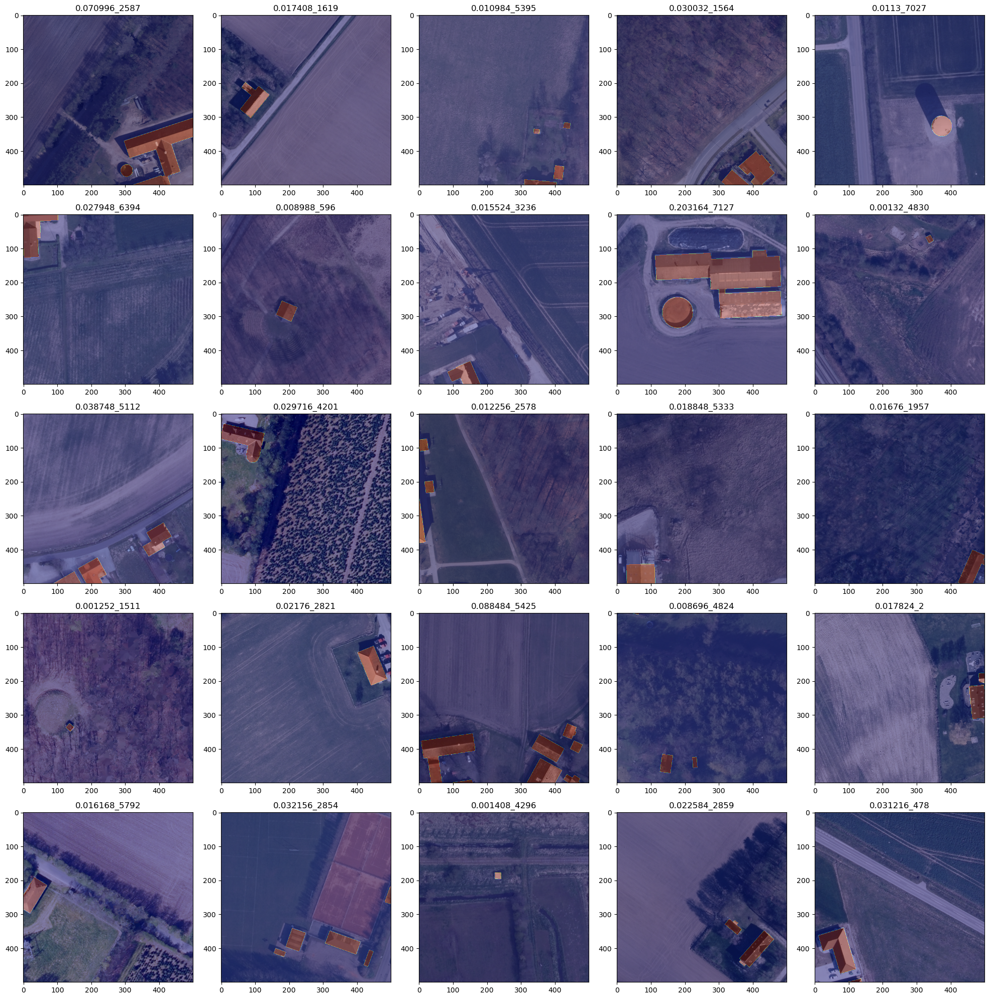

In [46]:
import numpy as np
import matplotlib.pyplot as plt

w = 10
h = 10
fig = plt.figure(figsize=(20, 20))
columns = 5
rows = 5
for i in range(1, columns*rows +1):
    #img = np.random.randint(10, size=(h,w))
    count = 25
    plot_idx = indexes[count + i-1]
    img = img_list[count + i-1]
    mask = mask_list[count + i-1]
    mask_percentage = mask_percentage_list[count + i-1]
    
    fig.add_subplot(rows, columns, i)
    plt.tight_layout()
    plt.imshow(img, cmap='gray')
    plt.imshow(mask, cmap='jet', alpha=0.4)
    plt.title(f'{mask_percentage}_{plot_idx}')

plt.show()
tmp = [4562, 5939, 4024, 2501]

In [ ]:
#df.to_csv('../csv/train_val_noise.csv', index=False)